In [1]:
from ct_utils import ctshow, ctsave
from data_loader import CTDataset

In [2]:
%load_ext autoreload
%autoreload 2

## Data visualization - Without Model prediction

In [7]:
EASY_MODE=False
DATASET_DIR = "COVID-CTset"

if EASY_MODE:
    mask_dims = (16, 16)
    inpaint_dims = (2, 16, 16)
else:
    mask_dims = (64, 64)
    inpaint_dims = (2, 64, 64)

In [29]:
healthy_ds = CTDataset(DATASET_DIR, limit_dataset=5, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)

In [30]:
scan, mask, masked = healthy_ds[1]


COVID-CTset/normal1/patient146/SR_4


In [9]:
scan, mask, masked = healthy_ds[1]

target_mask = torch.masked_select(scan, mask)
target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)


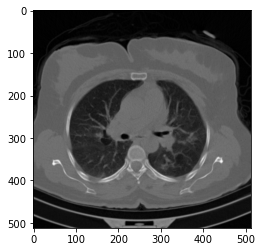

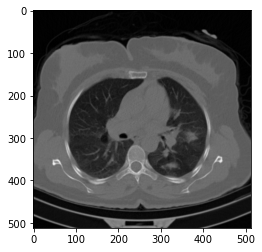

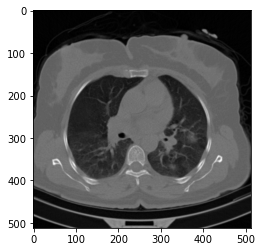

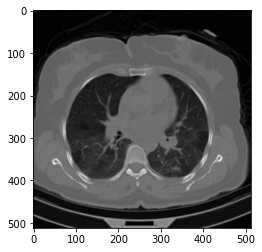

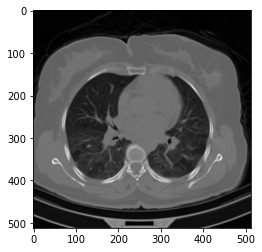

...

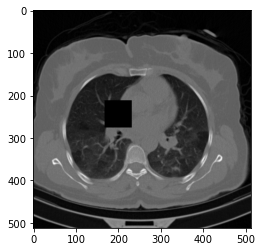

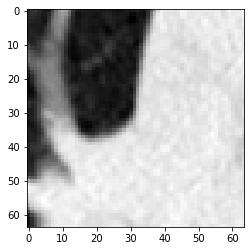

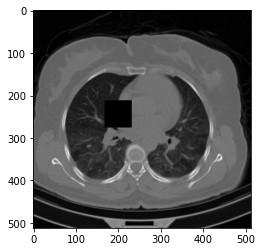

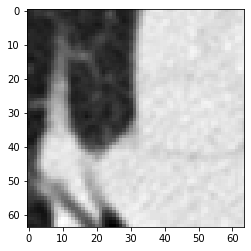

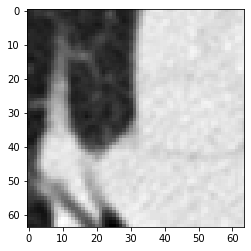

In [20]:
# ctshow(masked[3])
for i in range(8):
    ctshow(scan[i])
    ctsave(scan[i], f"./figures_data/negative_{i}")

ctshow(masked[3])
ctsave(masked[3], f"./figures_data/negative_masked_1")
ctshow(target_mask[0])
ctsave(target_mask[0], f"./figures_data/negative_mask_1")

ctshow(masked[4])
ctsave(masked[4], f"./figures_data/negative_masked_2")
ctshow(target_mask[1])
ctsave(target_mask[1], f"./figures_data/negative_mask_2")



In [41]:
covid_ds = CTDataset(DATASET_DIR, limit_dataset=None, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims, covid_positive=True)


In [42]:
covid_ds._scans_paths

['COVID-CTset/covid1/patient1/SR_2',
 'COVID-CTset/covid1/patient1/SR_3',
 'COVID-CTset/covid1/patient10/SR_2',
 'COVID-CTset/covid1/patient10/SR_3',
 'COVID-CTset/covid1/patient101/SR_3',
 'COVID-CTset/covid1/patient101/SR_4',
 'COVID-CTset/covid1/patient103/SR_4',
 'COVID-CTset/covid1/patient105/SR_2',
 'COVID-CTset/covid1/patient105/SR_3',
 'COVID-CTset/covid1/patient11/SR_2',
 'COVID-CTset/covid1/patient11/SR_3',
 'COVID-CTset/covid1/patient115/SR_4',
 'COVID-CTset/covid1/patient117/SR_3',
 'COVID-CTset/covid1/patient117/SR_4',
 'COVID-CTset/covid1/patient118/SR_3',
 'COVID-CTset/covid1/patient118/SR_4',
 'COVID-CTset/covid1/patient119/SR_3',
 'COVID-CTset/covid1/patient120/SR_2',
 'COVID-CTset/covid1/patient121/SR_2',
 'COVID-CTset/covid1/patient121/SR_3',
 'COVID-CTset/covid1/patient122/SR_3',
 'COVID-CTset/covid1/patient122/SR_4',
 'COVID-CTset/covid1/patient13/SR_3',
 'COVID-CTset/covid1/patient13/SR_4',
 'COVID-CTset/covid1/patient15/SR_3',
 'COVID-CTset/covid1/patient15/SR_4'

In [47]:
scan, mask, masked = covid_ds[40]

COVID-CTset/covid1/patient29/SR_3


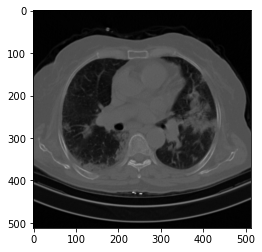

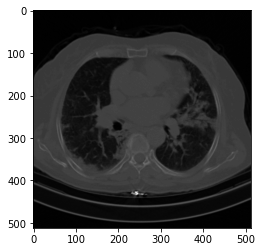

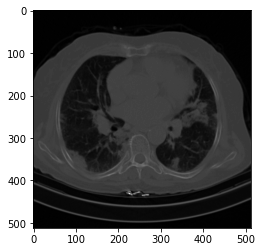

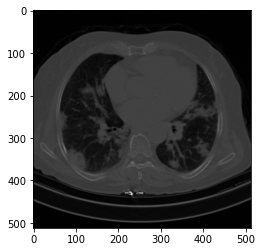

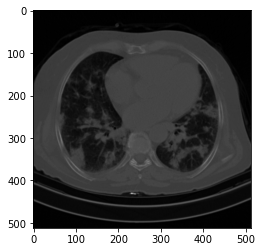

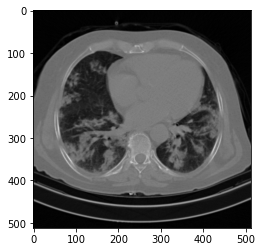

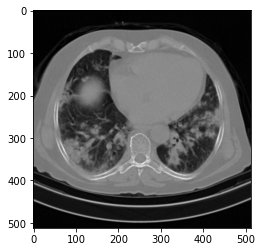

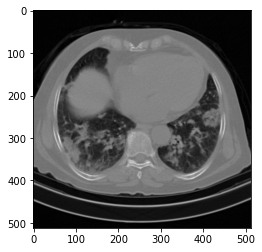

In [48]:
# ctshow(masked[3])
for i in range(8):
    ctshow(scan[i])
    # ctsave(scan[i], f"./figures_data/positive_{i}")    

## Model performance

In [25]:
import torch
assert torch.cuda.is_available(), "Cuda isn't available"

from unet3d.models.pytorch.autoencoder.variational import ConvolutionalAutoEncoder

In [23]:
model_path = r"./checkpoints/03-17-23-0145-epoch-600"

In [26]:
device = torch.device('cuda')

model = ConvolutionalAutoEncoder(decoder_mirrors_encoder=True).to(device)
# optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

In [27]:
healthy_ds = CTDataset(DATASET_DIR, limit_dataset=5, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)


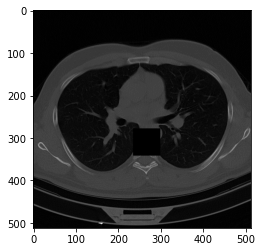

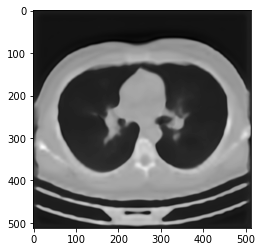

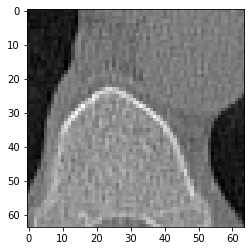

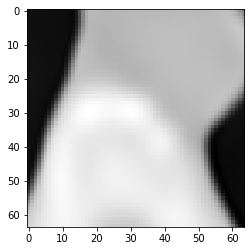

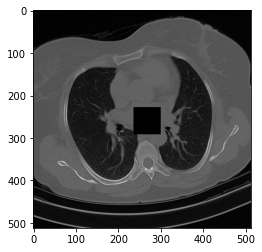

...

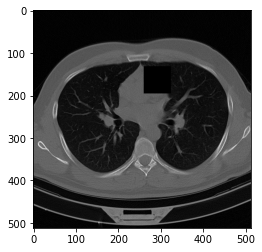

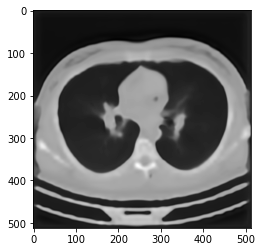

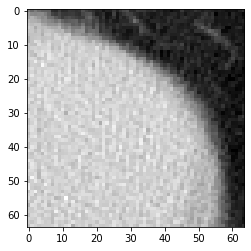

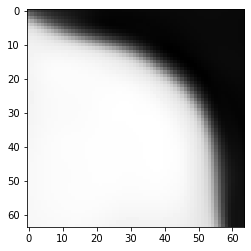

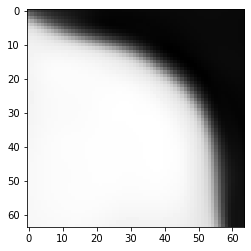

In [51]:
DATASET_DIR = "COVID-CTset"
# train_set = CTDataset(DATASET_DIR, limit_dataset=1, num_masked_slices=2, padding_slices=3)
if EASY_MODE:
    mask_dims = (16, 16)
    inpaint_dims = (2, 16, 16)
else:
    mask_dims = (64, 64)
    inpaint_dims = (2, 64, 64)
    
train_set = CTDataset(DATASET_DIR, limit_dataset=10, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)

data_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=2)

# Initialize model
# model = VQVAE(in_channel=1).to(device)

with torch.no_grad():
    for i, (scan, mask, masked) in enumerate(data_loader):
        target = scan
        mask = mask.to(device)
        masked = masked.to(device)
        target = target.to(device)

        masked = masked[None, :]
        masked = masked.transpose(0, 1)
        output = model(masked)
        output = output.squeeze()

        predicted_mask = torch.masked_select(output, mask)
        target_mask = torch.masked_select(target, mask)
        predicted_mask = predicted_mask.to(torch.device('cpu')).reshape(*inpaint_dims)
        target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)

        masked = masked.squeeze().cpu()
        output = output.cpu()
        ctshow(masked[3])
        ctsave(masked[3], f"./figures_data/results/masked_{i}")
        ctshow(output[3])
        ctsave(output[3], f"./figures_data/results/output_{i}")
        ctshow(target_mask[0])
        ctsave(target_mask[0], f"./figures_data/results/target_mask_{i}")
        ctshow(predicted_mask[0])
        ctsave(predicted_mask[0], f"./figures_data/results/predicted_mask_{i}")
        
        

In [ ]:
scan, mask, masked = healthy_ds[1]

# target_mask = torch.masked_select(scan, mask)
# target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)

# # ctshow(masked[3])
# for i in range(8):
#     ctshow(scan[i])
#     ctsave(scan[i], f"./figures_data/negative_{i}")

# ctshow(masked[3])
# ctsave(masked[3], f"./figures_data/negative_masked_1")
# ctshow(target_mask[0])
# ctsave(target_mask[0], f"./figures_data/negative_mask_1")

# ctshow(masked[4])
# ctsave(masked[4], f"./figures_data/negative_masked_2")
# ctshow(target_mask[1])
# ctsave(target_mask[1], f"./figures_data/negative_mask_2")



In [ ]:
with torch.no_grad():
    for i in range(4):
        scan, mask, masked = healthy_ds[i]
        target = scan
        mask = mask.to(device)
        masked = masked.to(device)
        target = target.to(device)

        masked = masked[None, :]
        masked = masked.transpose(0, 1)
        output = model(masked)
        output = output.squeeze()

        predicted_mask = torch.masked_select(output, mask)
        target_mask = torch.masked_select(target, mask)
        predicted_mask = predicted_mask.to(torch.device('cpu')).reshape(*inpaint_dims)
        target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)

        output = output.cpu()
        masked = masked.squeeze().cpu()
        ctshow(masked[3])
        ctshow(output[3])
        ctshow(target_mask[0])
        ctshow(predicted_mask[0])

In [52]:
test_ds =  CTDataset(DATASET_DIR, limit_dataset=None, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)


In [53]:
len(test_ds._scans_paths)

546

In [54]:
test_ds =  CTDataset(DATASET_DIR, limit_dataset=None, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims, covid_positive=True)
len(test_ds._scans_paths)


147

In [55]:
test_ds[0][0].shape

torch.Size([8, 512, 512])